In [1]:
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# This file contains all the main external libs we'll use
import fastai
from fastai.imports import *
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *

In [3]:
PATH = "../../CHRC_NEW_DATA/chrc_data_patches_norm_1000_dup/"
sz=256
arch=resnet50

In [4]:
torch.cuda.is_available()

True

In [5]:
torch.backends.cudnn.enabled

True

In [6]:
os.listdir(PATH)

['models', 'tmp', 'valid', 'train']

In [7]:
files = os.listdir(f'{PATH}valid/Celiac')[:5]
files

['C06-32_02__6322_1500___1000_1000_0.jpg',
 'C07-35_07__1500_3212___0_0_0.jpg',
 'C06-28_02__7500_6000___500_0_0.jpg',
 'C07-35_01__7205_3000___0_500_0.jpg',
 'C14-71_01__1500_1500___500_1500_0.jpg']

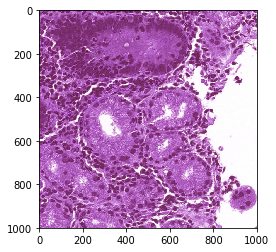

In [8]:
img = plt.imread(f'{PATH}valid/Celiac/{files[4]}')
plt.imshow(img);

In [9]:
arch=resnet50
data = ImageClassifierData.from_paths(PATH, tfms=tfms_from_model(arch, sz), bs=8)
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [15]:
learn.fit(0.001, 2)

epoch      trn_loss   val_loss   accuracy                        
    0      0.443531   0.49896    0.782074  
    1      0.406466   0.477206   0.794474                        



[0.4772062137856943, 0.7944741893120517]

## Visualising Results

In [10]:
# This is the label for a val data
data.val_y

array([0, 0, 0, ..., 2, 2, 2])

In [11]:
# from here we know that 'Celiac' is label 0 and 'EE' is label 1 and 'Normal' is label 2
data.classes

['Celiac', 'EE', 'Normal']

## Data Augmentation

In [10]:
# Using predefined augmentations transforms_top_down
tfms = tfms_from_model(resnet50, sz=256, aug_tfms=transforms_top_down, max_zoom=1.1)

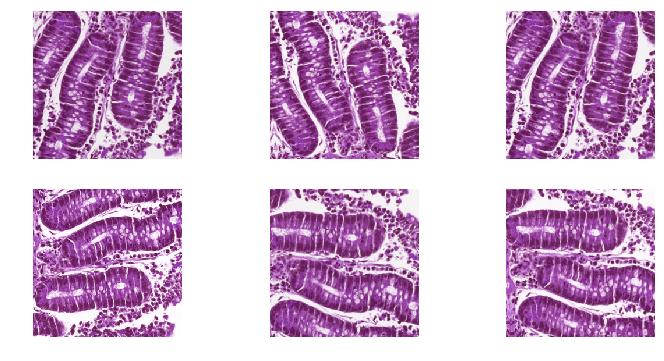

In [11]:
# Visualising the augmentation
def get_augs():
    data = ImageClassifierData.from_paths(PATH, bs=2, tfms=tfms, num_workers=1)
    x,_ = next(iter(data.aug_dl))
    return data.trn_ds.denorm(x)[1]
ims = np.stack([get_augs() for i in range(6)])
plots(ims, rows=2)

In [12]:
# Initializing the data with augmentation and learn method
data = ImageClassifierData.from_paths(PATH, tfms=tfms, bs=8)
learn = ConvLearner.pretrained(arch, data, precompute=False)
learn.precompute = False

In [19]:
lrf=learn.lr_find()

 81%|████████  | 1363/1687 [15:04<05:56,  1.10s/it, loss=2.35] 

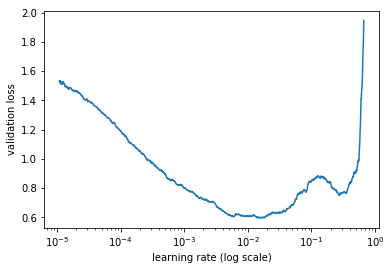

In [20]:
learn.sched.plot()

## Unfreezing layers and using Differential learning rates

In [13]:
# Unfreeze all layers for training
learn.unfreeze()

In [14]:
lr = 1e-3

In [15]:
lr=np.array([lr/9,lr/3,lr])

In [16]:
learn.fit(lr, 3, cycle_len=1, cycle_mult=1)

epoch      trn_loss   val_loss   accuracy                           
    0      0.042223   0.03251    0.987502  
 76%|███████▌  | 10224/13493 [50:11<15:42,  3.47it/s, loss=0.0138] 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



    1      0.042294   0.022618   0.99463                            
    2      0.011633   0.01664    0.995856                            



[0.01663950132569048, 0.9958561246477706]

In [17]:
learn.save('1000x1000_256_resnet50_staintools')

In [18]:
learn.load('1000x1000_256_resnet50_staintools')

## Analyzing results

### Confusion Matrix and Accuracy with Test Time Augmentation

In [19]:
# Getting log predictions with TTA
log_preds,y = learn.TTA()
probs = np.mean(np.exp(log_preds),0)
accuracy_np(probs, y)

0.9968838057351235

In [20]:
log_preds.shape

(5, 30165, 3)

In [23]:
np.save('../results/logpreds_resnet50_all_layers256x256_duplicates_TTA_staintools.npy', log_preds)

In [24]:
log_preds = np.load('../results/logpreds_resnet50_all_layers256x256_duplicates_TTA_staintools.npy')

In [21]:
log_preds_mean = np.mean(log_preds, 0)

In [22]:
preds = np.argmax(probs, axis=1)

In [25]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y, preds)

[[ 9383    89     0]
 [    5 10655     0]
 [    0     0 10033]]


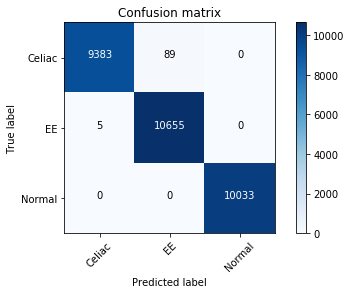

In [26]:
plot_confusion_matrix(cm, data.classes)

### Visualizing results with TTA

Most Correct Celiac


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


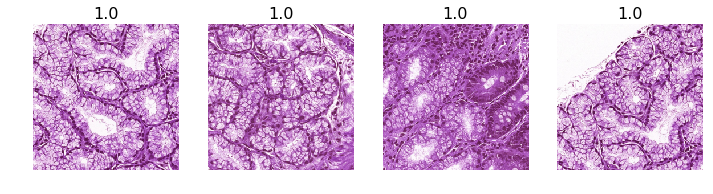

In [27]:
imr = ImageModelResults(data.val_ds, log_preds_mean)
print('Most Correct Celiac')
imr.plot_most_correct(0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Most Correct EE


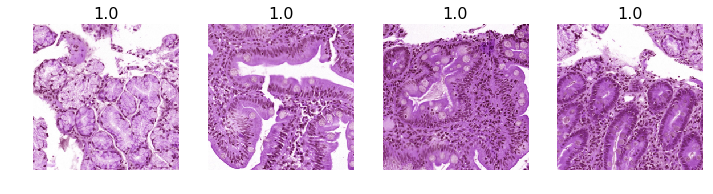

In [28]:
print('Most Correct EE')
imr.plot_most_correct(1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Most Correct Noraml


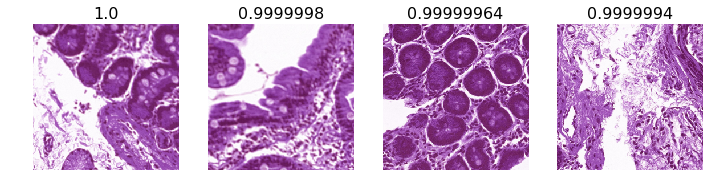

In [29]:
print('Most Correct Noraml')
imr.plot_most_correct(2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Most Incorrect Celiac


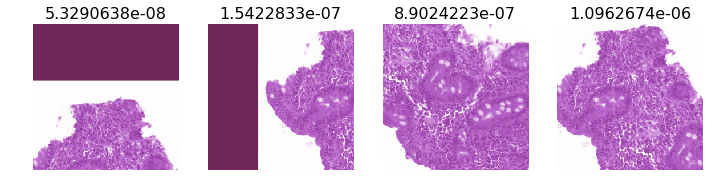

In [30]:
print('Most Incorrect Celiac')
imr.plot_most_incorrect(0)

Most Incorrect EE


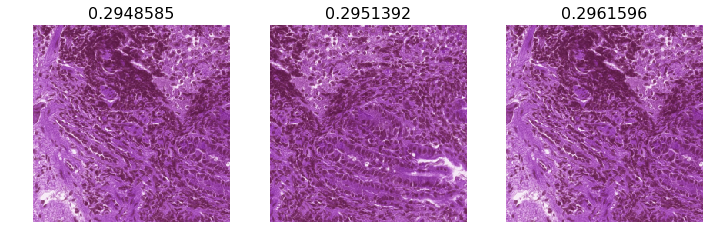

In [31]:
print('Most Incorrect EE')
imr.plot_most_incorrect(1)

In [32]:
print('Most Incorrect Normal')
imr.plot_most_incorrect(2)

Most Incorrect Normal


False

Most Uncertain Celiac


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


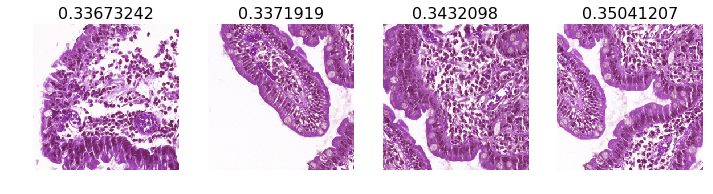

In [33]:
print('Most Uncertain Celiac')
imr.plot_most_uncertain(0)

Most Uncertain EE


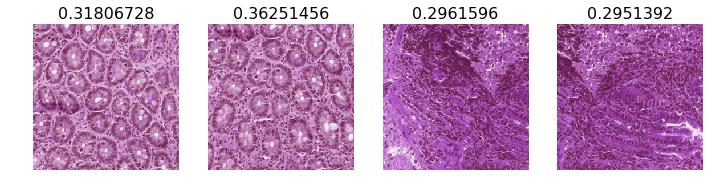

In [34]:
print('Most Uncertain EE')
imr.plot_most_uncertain(1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Most Uncertain Normal


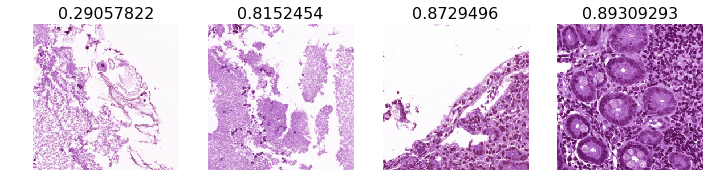

In [35]:
print('Most Uncertain Normal')
imr.plot_most_uncertain(2)

## DeConvs

In [ ]:
# Some Helper functions
from PIL import Image
def image_loader(path, expand_dim=False):
    img = Image.open(path)
#     img = img.resize((256, 256))
    img = np.array(img, dtype=np.float32)
    img = np.einsum('ijk->kij', img)
    if expand_dim:
        img = img[None]
    # convert to torch 
    img = torch.from_numpy(img)
    return img

In [ ]:
def return_sequential(layer_num, model):
    return nn.Sequential(
            *list(model.children())[:layer_num]
        )

class get_activation_layer(nn.Module):
    def __init__(self, model, total_layers):
        super().__init__()
        self.model = model
        self.total_layers = total_layers
        self.layer_models = []
        for i in range(self.total_layers):
             self.layer_models.append(return_sequential(i, self.model))
    def forward(self, x):
        self.outputs = []
        for i in range(self.total_layers):
            self.outputs.append(self.layer_models[i](x))
        return self.outputs

In [ ]:
tmp_model = get_activation_layer(model, 16)

In [ ]:
!mkdir ../layers_vis/model1000x1000_256_resnet50/

In [ ]:
def visulaize_layers(outputs):
    for index, layer in enumerate(outputs):
        features = layer.data
        size_plot = features.shape[1]
        if size_plot % 2 != 0:
            size_plot += 1
        original_size = np.int(np.ceil(np.sqrt(size_plot)))
        f, axarr = plt.subplots(original_size + 1, original_size + 1, figsize=(40,40))
        i, j = 0,0
        counter = 1
        for blocks in features:
            for block in blocks:
                counter += 1
                x = block.cpu().numpy()
                if counter % original_size == 0:
                    i += 1
                    j = 0 

                axarr[i,j].imshow(x)
                j += 1
        counter = 0
        print(f'layer {index} done')
        f.savefig(f'../layers_vis/model1000x1000_256_resnet50/output{index}.jpg')
        print('image generated')
        if (index == 10):
            break

In [ ]:
img_path = f'{PATH}valid/Celiac/{files[4]}'
i = image_loader(f'{PATH}valid/Celiac/{files[4]}', expand_dim=True)
i = i.cuda()

layer_outputs = tmp_model(Variable(i))

In [ ]:
from IPython.display import Image as I
I(img_path)

In [ ]:
visulaize_layers(layer_outputs)

## Grad CAM

In [36]:
def get_cat_name(a):
    if a == 0:
        return 'Celiac'
    elif a == 1:
        return 'EE'
    elif a == 2:
        return 'Normal'
    else:
        return 'Something Wrong with label!'

In [37]:
class SaveFeatures():
    features=None
    def __init__(self, m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()

In [40]:
def plt_heatmap():
    
    m = nn.Sequential(*children(learn.model))
    figure = plt.figure(figsize=(30, 90))
    it = iter(data.val_dl)
    for i in range(27):
        subplot = figure.add_subplot(9, 3, i+1)
        subplot.axis('Off')
        x,y = next(it)
        x,y = x[None,0], y[None,0]
        subplot.set_title(get_cat_name(y))
        vx = Variable(x.cuda(), requires_grad=True)
        dx = data.val_ds.denorm(x)[0]
        sfs = [SaveFeatures(o) for o in [m[-11][2]._modules['conv2']]]
        py = m(vx)
        for o in sfs: o.remove()
        feat = np.maximum(0,to_np(sfs[0].features[0]))
        vx = Variable(x.cuda(), requires_grad=True)
        py = np.exp(to_np(py)[0])
        params = list(m.parameters())
        weight_softmax = np.squeeze(params[-2].data.cpu().numpy())
        f2=np.dot(np.rollaxis(feat,0,3), weight_softmax[0])
        f2-=f2.min()
        f2/=f2.max()
        plt.imshow(dx)
        plt.imshow(scipy.misc.imresize(f2, dx.shape), alpha=0.5, cmap='hot');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/apps/software/standard/core/anaconda3/5.2.0/lib/python3.6/site-packages/ipykernel_launcher.py:26: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats

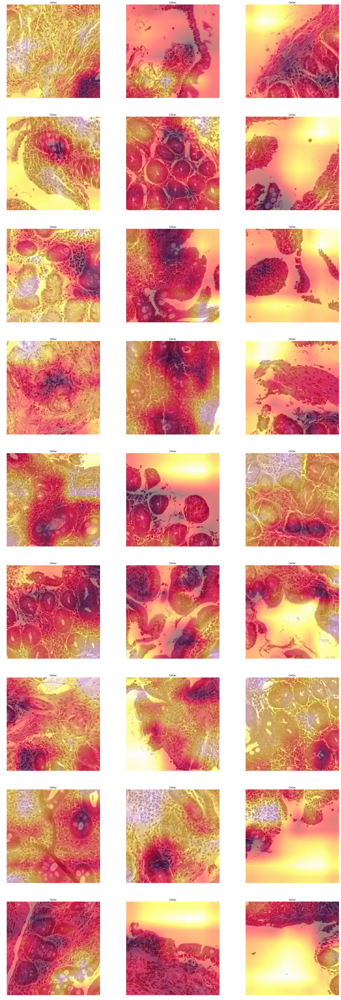

In [41]:
plt_heatmap()

In [42]:
def plt_heatmap_EE():
    
    m = nn.Sequential(*children(learn.model))
    figure = plt.figure(figsize=(30, 90))
    batch_iter = iter(data.val_dl)
    for k in range(1185):
        next(batch_iter)
#         print(k)
    print('Iterated!')
    for i in range(9):
        subplot = figure.add_subplot(9, 3, i+1)
        subplot.axis('Off')
        x,y = next(batch_iter)
        x,y = x[None,0], y[None,0]
        subplot.set_title(get_cat_name(y))
        vx = Variable(x.cuda(), requires_grad=True)
        dx = data.val_ds.denorm(x)[0]
        sfs = [SaveFeatures(o) for o in [m[-11][2]._modules['conv2']]]
        py = m(vx)
        for o in sfs: o.remove()
        feat = np.maximum(0,to_np(sfs[0].features[0]))
        vx = Variable(x.cuda(), requires_grad=True)
        py = np.exp(to_np(py)[0])
        params = list(m.parameters())
        weight_softmax = np.squeeze(params[-2].data.cpu().numpy())
        f2=np.dot(np.rollaxis(feat,0,3), weight_softmax[0])
        f2-=f2.min()
        f2/=f2.max()
        plt.imshow(dx)
        plt.imshow(scipy.misc.imresize(f2, dx.shape), alpha=0.5, cmap='hot');

Iterated!


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/apps/software/standard/core/anaconda3/5.2.0/lib/python3.6/site-packages/ipykernel_launcher.py:30: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


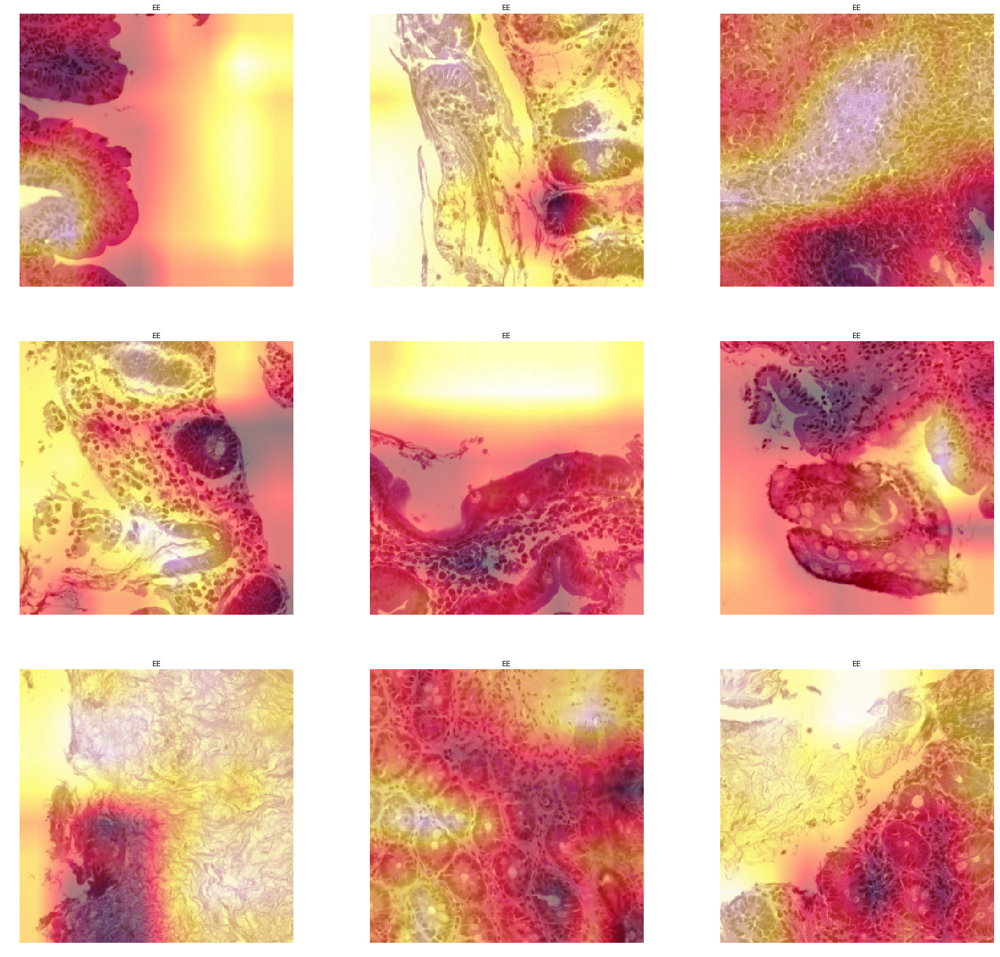

In [43]:
plt_heatmap_EE()

In [44]:
def plt_heatmap_Normal():
    m = nn.Sequential(*children(learn.model))
    figure = plt.figure(figsize=(30, 90))
    batch_iter = iter(data.val_dl)
    for k in range(2517):
        next(batch_iter)
#         print(k)
    print('Iterated!')
    for i in range(9):
        subplot = figure.add_subplot(9, 3, i+1)
        subplot.axis('Off')
        x,y = next(batch_iter)
        x,y = x[None,0], y[None,0]
        subplot.set_title(get_cat_name(y))
        vx = Variable(x.cuda(), requires_grad=True)
        dx = data.val_ds.denorm(x)[0]
        sfs = [SaveFeatures(o) for o in [m[-11][2]._modules['conv2']]]
        py = m(vx)
        for o in sfs: o.remove()
        feat = np.maximum(0,to_np(sfs[0].features[0]))
        vx = Variable(x.cuda(), requires_grad=True)
        py = np.exp(to_np(py)[0])
        params = list(m.parameters())
        weight_softmax = np.squeeze(params[-2].data.cpu().numpy())
        f2=np.dot(np.rollaxis(feat,0,3), weight_softmax[0])
        f2-=f2.min()
        f2/=f2.max()
        plt.imshow(dx)
        plt.imshow(scipy.misc.imresize(f2, dx.shape), alpha=0.5, cmap='hot');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/apps/software/standard/core/anaconda3/5.2.0/lib/python3.6/site-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iterated!


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


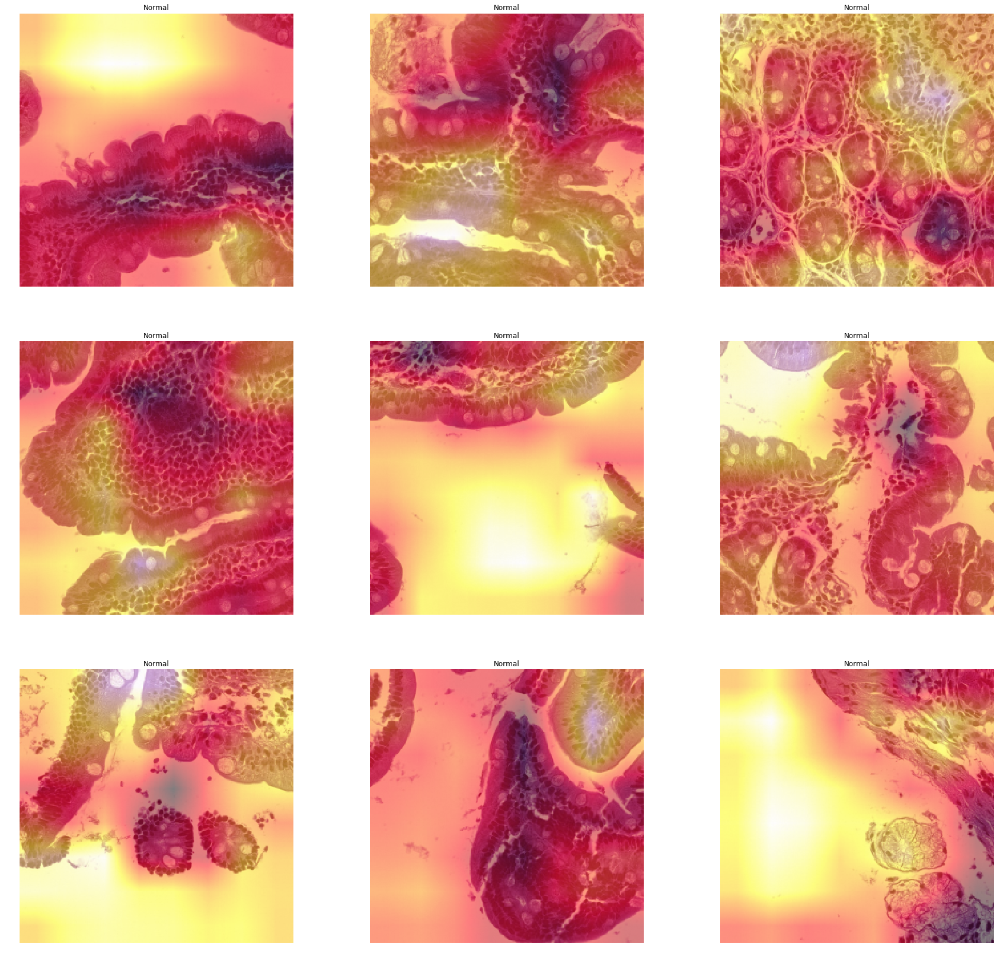

In [45]:
plt_heatmap_Normal()

## Saving predictions of the model with TTA

In [45]:
np.exp(log_preds_mean)

array([[0.17136, 0.00017, 0.39814],
       [0.99999, 0.     , 0.     ],
       [0.99952, 0.00002, 0.00011],
       ...,
       [0.00143, 0.     , 0.99724],
       [0.03098, 0.00019, 0.91937],
       [0.1621 , 0.00007, 0.78512]], dtype=float32)

In [46]:
res = pd.DataFrame(np.exp(log_preds_mean))

In [47]:
res['file'] = data.val_ds.fnames

In [48]:
res.columns = ['Celiac', 'EE', 'Normal', 'FileName']

In [49]:
res.to_csv('../results/preds_resnet50_256_duplicates_TTA_staintools.csv')

In [50]:
res.head()

,Celiac,EE,Normal,FileName
0,0.171363,0.000166,0.398144,valid/Celiac/C16-77_02_3330_999_1.jpg
1,0.999991,0.000002,0.000004,valid/Celiac/C06-27_02_5994_4662_0.jpg
2,0.999517,0.000018,0.000107,valid/Celiac/C06-28_02_13653_666_1.jpg
3,0.999978,0.000009,0.000002,valid/Celiac/C06-28_02_13320_1332_1.jpg
4,0.999983,0.000009,0.000004,valid/Celiac/C06-32_02_5994_2664_0.jpg
